In [3]:
!pip install pandas

In [4]:
!pip install matplotlib

In [5]:
!pip install numpy

In [6]:

import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
df = pd.read_csv('phishing_site_urls.csv')

In [8]:
df.head()

,URL,Label
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,bad
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,bad
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,bad
3,mail.printakid.com/www.online.americanexpress....,bad
4,thewhiskeydregs.com/wp-content/themes/widescre...,bad


In [9]:
df.shape

(549346, 2)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 549346 entries, 0 to 549345
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   URL     549346 non-null  object
 1   Label   549346 non-null  object
dtypes: object(2)
memory usage: 8.4+ MB


In [11]:
df.isnull()

,URL,Label
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
549341,False,False
549342,False,False
549343,False,False
549344,False,False


In [12]:
df.Label.value_counts()

Label
good    392924
bad     156422
Name: count, dtype: int64

In [13]:
! pip install nltk

In [14]:
from nltk.tokenize import RegexpTokenizer


In [15]:
tokenizer = RegexpTokenizer(r'[A-Za-z]+')

In [16]:
df.URL[0]

'nobell.it/70ffb52d079109dca5664cce6f317373782/login.SkyPe.com/en/cgi-bin/verification/login/70ffb52d079109dca5664cce6f317373/index.php?cmd=_profile-ach&outdated_page_tmpl=p/gen/failed-to-load&nav=0.5.1&login_access=1322408526'

In [17]:
tokenizer.tokenize(df.URL[0])

['nobell',
 'it',
 'ffb',
 'd',
 'dca',
 'cce',
 'f',
 'login',
 'SkyPe',
 'com',
 'en',
 'cgi',
 'bin',
 'verification',
 'login',
 'ffb',
 'd',
 'dca',
 'cce',
 'f',
 'index',
 'php',
 'cmd',
 'profile',
 'ach',
 'outdated',
 'page',
 'tmpl',
 'p',
 'gen',
 'failed',
 'to',
 'load',
 'nav',
 'login',
 'access']

In [18]:
df['text_tokenized'] = df.URL.map(lambda t : tokenizer.tokenize(t))

In [19]:
df.head()

,URL,Label,text_tokenized
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,bad,"[nobell, it, ffb, d, dca, cce, f, login, SkyPe..."
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,bad,"[www, dghjdgf, com, paypal, co, uk, cycgi, bin..."
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,bad,"[serviciosbys, com, paypal, cgi, bin, get, int..."
3,mail.printakid.com/www.online.americanexpress....,bad,"[mail, printakid, com, www, online, americanex..."
4,thewhiskeydregs.com/wp-content/themes/widescre...,bad,"[thewhiskeydregs, com, wp, content, themes, wi..."


In [20]:
from nltk.stem.snowball import SnowballStemmer

In [21]:
stemmer = SnowballStemmer('english')

In [22]:
df['text_stemmed'] = df['text_tokenized'].map(lambda l : [stemmer.stem(word) for word in l])

In [23]:
df.head()

,URL,Label,text_tokenized,text_stemmed
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,bad,"[nobell, it, ffb, d, dca, cce, f, login, SkyPe...","[nobel, it, ffb, d, dca, cce, f, login, skype,..."
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,bad,"[www, dghjdgf, com, paypal, co, uk, cycgi, bin...","[www, dghjdgf, com, paypal, co, uk, cycgi, bin..."
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,bad,"[serviciosbys, com, paypal, cgi, bin, get, int...","[serviciosbi, com, paypal, cgi, bin, get, into..."
3,mail.printakid.com/www.online.americanexpress....,bad,"[mail, printakid, com, www, online, americanex...","[mail, printakid, com, www, onlin, americanexp..."
4,thewhiskeydregs.com/wp-content/themes/widescre...,bad,"[thewhiskeydregs, com, wp, content, themes, wi...","[thewhiskeydreg, com, wp, content, theme, wide..."


In [24]:
df['text'] = df['text_stemmed'].map(lambda l: ' '.join(l))

In [25]:
df.head()

,URL,Label,text_tokenized,text_stemmed,text
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,bad,"[nobell, it, ffb, d, dca, cce, f, login, SkyPe...","[nobel, it, ffb, d, dca, cce, f, login, skype,...",nobel it ffb d dca cce f login skype com en cg...
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,bad,"[www, dghjdgf, com, paypal, co, uk, cycgi, bin...","[www, dghjdgf, com, paypal, co, uk, cycgi, bin...",www dghjdgf com paypal co uk cycgi bin webscrc...
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,bad,"[serviciosbys, com, paypal, cgi, bin, get, int...","[serviciosbi, com, paypal, cgi, bin, get, into...",serviciosbi com paypal cgi bin get into herf s...
3,mail.printakid.com/www.online.americanexpress....,bad,"[mail, printakid, com, www, online, americanex...","[mail, printakid, com, www, onlin, americanexp...",mail printakid com www onlin americanexpress c...
4,thewhiskeydregs.com/wp-content/themes/widescre...,bad,"[thewhiskeydregs, com, wp, content, themes, wi...","[thewhiskeydreg, com, wp, content, theme, wide...",thewhiskeydreg com wp content theme widescreen...


In [26]:
good_sites = df[df.Label == 'good']
bad_sites = df[df.Label == 'bad']

In [27]:
good_sites.head()

,URL,Label,text_tokenized,text_stemmed,text
18231,esxcc.com/js/index.htm?us.battle.net/noghn/en/...,good,"[esxcc, com, js, index, htm, us, battle, net, ...","[esxcc, com, js, index, htm, us, battl, net, n...",esxcc com js index htm us battl net noghn en r...
18232,wwweira¯&nvinip¿ncH¯wVö%ÆåyDaHðû/ÏyEùuË\nÓ6...,good,"[www, eira, nvinip, ncH, wV, yDaH, yE, u, rT, ...","[www, eira, nvinip, nch, wv, ydah, ye, u, rt, ...",www eira nvinip nch wv ydah ye u rt u g m i xz...
18233,'www.institutocgr.coo/web/media/syqvem/dk-óij...,good,"[www, institutocgr, coo, web, media, syqvem, d...","[www, institutocgr, coo, web, media, syqvem, d...",www institutocgr coo web media syqvem dk ij r ...
18234,Yìê koãÕ»Î§DéÎl½ñ¡ââqtò¸/à; Í,good,"[Y, ko, D, l, qt]","[y, ko, d, l, qt]",y ko d l qt
18236,ruta89fm.com/images/AS@Vies/1i75cf7b16vc<Fd16...,good,"[ruta, fm, com, images, AS, Vies, i, cf, b, vc...","[ruta, fm, com, imag, as, vie, i, cf, b, vc, f...",ruta fm com imag as vie i cf b vc f d b g sd v...


In [28]:
def plot_wordcloud(text, mask=None, max_words=400, max_font_size=120, figure_size=(24.0, 16.0),
                   title=None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'com', 'http'}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color='white',
                          stopwords=stopwords,
                          max_words=max_words,
                          max_font_size=max_font_size,
                          random_state=42,
                          mask=mask)

    wordcloud.generate(text)

    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask)
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear');
        plt.title(title, fontdict={'size': title_size, 'color': 'green',
                                   'verticalalignment': 'bottom'})

    else:
        plt.imshow(wordcloud)
        plt.title(title, fontdict={'size': title_size, 'color': 'green',
                                   'verticalalignment': 'bottom'})

    plt.axis('off');
    plt.tight_layout()

In [29]:
all_text = ' '.join(good_sites['text'].tolist())

In [30]:
all_text

'esxcc com js index htm us battl net noghn en ref m d bbws b tnefnud d j y j p lr cmp p t p i q jq d vt srdig v y fk fv x my r s ki zb tu em q lmj c e el l x h j u g ip o i tv d k xo o o c hi f d g p ip vz a vwk s d n a q f tj w xh t i u s cy j l d r u amp offerid newmail en us v amp sitest ver www eira nvinip nch wv ydah ye u rt u g m i xz fn u f w c t j ev p e z s p s i v jl w j o p h c r qb g z d m q x b t m n p m q a u db q vu r h j www institutocgr coo web media syqvem dk ij r gr dfe cmg g h c b l p l a kzh z t b ua a r g q k c s q n vo z c g e zh t vx qx n pm dx an a a c b a jl m x x u x e b o y ko d l qt ruta fm com imag as vie i cf b vc f d b g sd vd qt n s r m e zw k m o d c h d e e e e h y u u m j v bs u kp g y k ds g e x o n h ai p vr y  esxcc com js index htm us battl net login en ref ifezuzrus battl net d en in ex ao app c m d b l ph w xyoy vn i f ys o t i wn f cb n e i u tvi c q a e l c z f fj i zz z t h p l st g c q v esxcc com js index htm us battl net login en ref mtny

In [31]:
! pip install wordcloud

In [32]:
from wordcloud import WordCloud

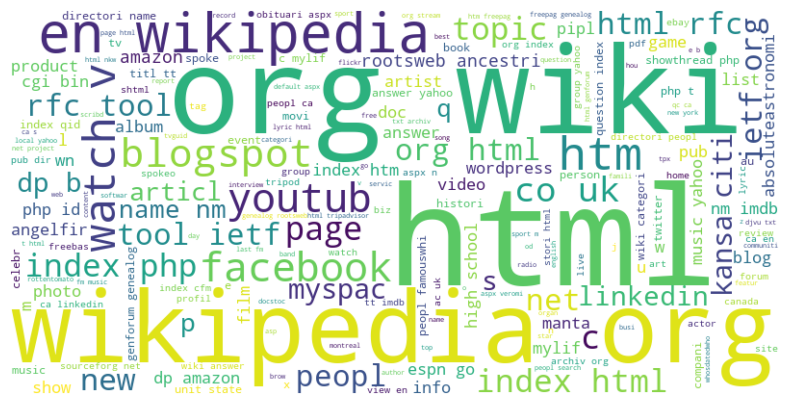

In [33]:
wordcloud = WordCloud(width=800, height=400, background_color= 'white').generate(all_text)

plt.figure(figsize =(10,5))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [34]:
all_texts=' '.join(bad_sites['text'].tolist())

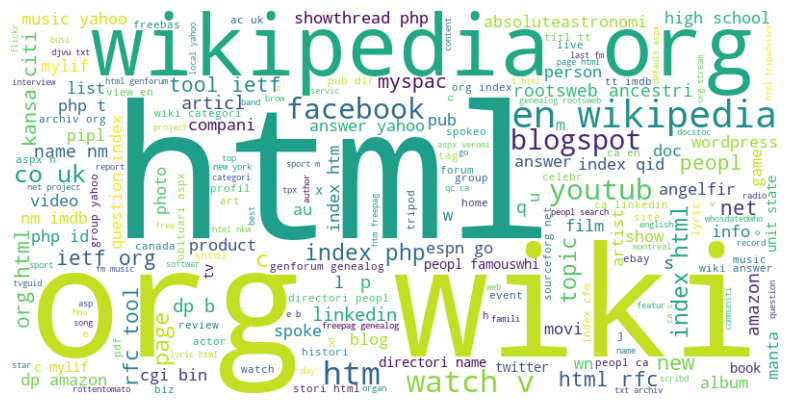

In [35]:
#generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [36]:
df.head()

,URL,Label,text_tokenized,text_stemmed,text
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,bad,"[nobell, it, ffb, d, dca, cce, f, login, SkyPe...","[nobel, it, ffb, d, dca, cce, f, login, skype,...",nobel it ffb d dca cce f login skype com en cg...
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,bad,"[www, dghjdgf, com, paypal, co, uk, cycgi, bin...","[www, dghjdgf, com, paypal, co, uk, cycgi, bin...",www dghjdgf com paypal co uk cycgi bin webscrc...
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,bad,"[serviciosbys, com, paypal, cgi, bin, get, int...","[serviciosbi, com, paypal, cgi, bin, get, into...",serviciosbi com paypal cgi bin get into herf s...
3,mail.printakid.com/www.online.americanexpress....,bad,"[mail, printakid, com, www, online, americanex...","[mail, printakid, com, www, onlin, americanexp...",mail printakid com www onlin americanexpress c...
4,thewhiskeydregs.com/wp-content/themes/widescre...,bad,"[thewhiskeydregs, com, wp, content, themes, wi...","[thewhiskeydreg, com, wp, content, theme, wide...",thewhiskeydreg com wp content theme widescreen...


In [37]:
from sklearn.feature_extraction.text import CountVectorizer

In [38]:
cv = CountVectorizer()

In [39]:
features= cv.fit_transform(df.text)

In [40]:
features[:5].toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(5, 350837))

In [41]:
from sklearn.model_selection import train_test_split

In [42]:
x_train, x_test, y_train, y_test =train_test_split(features , df.Label, test_size = 0.2)

### Model Training

In [43]:
from sklearn.linear_model import LogisticRegression

In [44]:
l_model = LogisticRegression()

In [45]:
l_model.fit(x_train, y_train)

C:\Users\HP\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


In [46]:
l_model.score(x_test, y_test)

0.9654318740329481

In [47]:
l_model.score(x_train, y_train)

0.9785153227935086

In [48]:
from sklearn.metrics import classification_report

In [49]:
print('\n CLASSIFICATION REPORT \n')
print(classification_report(l_model.predict(x_test),y_test, target_names=['Bad', 'Good']))


 CLASSIFICATION REPORT 

              precision    recall  f1-score   support

         Bad       0.91      0.97      0.94     29296
        Good       0.99      0.97      0.98     80574

    accuracy                           0.97    109870
   macro avg       0.95      0.97      0.96    109870
weighted avg       0.97      0.97      0.97    109870



In [50]:
from sklearn.metrics import confusion_matrix

In [51]:
con_mat = pd.DataFrame(confusion_matrix(l_model.predict(x_test), y_test), 
                      columns = ['Predicted:Bad','Predicted:Good'],
                      index = ['Actual: Bad', 'Actual:Good'])

In [52]:
!pip install seaborn

In [53]:
import seaborn as sns


 CONFUSION MATRIX 
 


<Axes: >

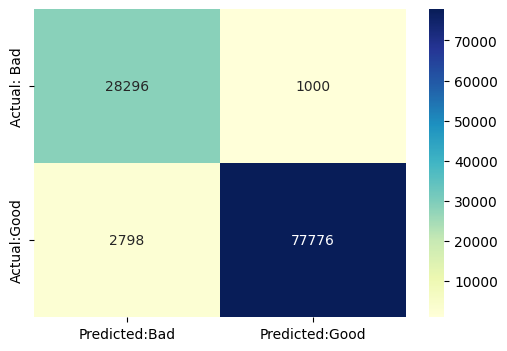

In [54]:
print('\n CONFUSION MATRIX \n ')
plt.figure(figsize =(6,4))
sns.heatmap(con_mat, annot= True , fmt ='d', cmap="YlGnBu")


In [55]:
from sklearn.naive_bayes import MultinomialNB

In [56]:
mnb = MultinomialNB()

In [57]:
mnb.fit(x_train, y_train)

,alpha,1.0
,force_alpha,True
,fit_prior,True
,class_prior,None


In [58]:
mnb.score(x_test, y_test)

0.9581778465459179

### Save Model Using Flask

In [69]:
import pickle

In [70]:
pickle.dump(l_model, open('phising.pkl', 'wb'))

In [71]:
pickle.dump(mnb, open('phising_mnb,pkl','wb'))

In [72]:
pickle.dump(cv, open('vectorizer.pkl', 'wb'))

### TEST MODEL IN NEW URLs

In [73]:
predict_bad = ['highpowerresources.com ','defibel.org/wp-includes/images/index.html', 'apple-checker.org/']
predict_good = ['https://www.example.com/about-us','https://www.hostinger.com/tutorials/how-to-make-a-website','https://example.com/page']

In [74]:
predict_good =cv.transform(predict_good)

In [75]:
predict_bad =cv.transform(predict_bad)

In [76]:
l_model.predict(predict_good)

array(['good', 'bad', 'bad'], dtype=object)

In [77]:
l_model.predict(predict_bad)

array(['good', 'bad', 'good'], dtype=object)

In [78]:
mnb.predict(predict_good)

array(['bad', 'good', 'bad'], dtype='<U4')